<a href="https://colab.research.google.com/github/samuel-haddad/MBAUSP/blob/main/eda_tcc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **EDA**

#### MBA Data Science & Analytics - USP & ESALQ
Trabalho de Conclusão de Curso - 02/2022 <br>
**Título:** Um estudo comparativo entre modelos Multinível, Logístico e XGBoost na detecção de fraudes ideológicas no setor financeiro. <br>
**Autor:** Samuel Haddad Simões Machado
<br>

## Bibliotecas

In [1]:
%%capture
# install libs
!pip install dython #just in case
!pip install -U matplotlib==3.5.3
!pip install sweetviz

**REINICIAR O AMBIENTE DE EXECUÇÃO**

In [1]:
# pacotes básicos
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

# eda libs
import sweetviz as sv
from dython import nominal

# google libs & auth
from google.colab import auth
auth.authenticate_user()

import gspread
from google.auth import default
creds, _ = default()

gc = gspread.authorize(creds)

## Dataset

In [2]:
# importar o dataset
sht1 = gc.open_by_key('14di6Prcuk4vAGsd43r60cnKcZh_M6ziQV8Ht7xcJ0b4')
df_sheet = sht1.get_worksheet(0)
df_data = df_sheet.get_all_records()

# criar o dataframe
df = pd.DataFrame(df_data)

# visualizar os dados
df.head()

,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,...,var283,var284,var285,var286,var287,var288,var289,target,group,id
0,0.422658,0.030134,0.502699,-0.150856,-1.408410,0.008990,1,0,0,0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0,20,26
1,0.422658,0.662074,0.378098,-0.352544,-2.600380,0.549807,1,0,0,0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0,20,54
2,-0.277668,-0.024085,0.414200,0.068187,0.975530,0.549807,0,0,1,0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0,18,105
3,-0.243825,0.662074,-1.792512,1.268581,1.174192,-1.072644,0,0,0,0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0,18,154
4,0.086277,0.662074,0.608747,-0.352544,-0.613763,0.549807,0,1,0,0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1,27,182


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14839 entries, 0 to 14838
Columns: 292 entries, var1 to id
dtypes: float64(49), int64(243)
memory usage: 33.1 MB


## Auto EDA

                                             |          | [  0%]   00:00 -> (? left)

Report fraud_prevention_eda.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



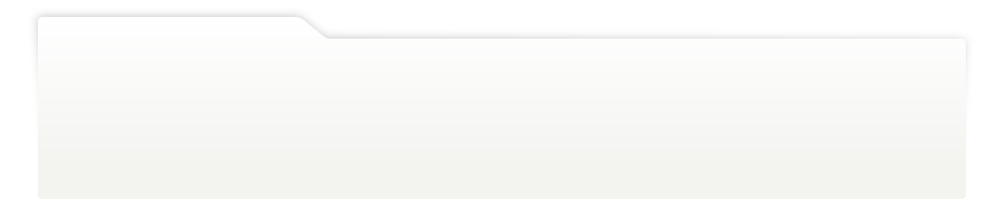
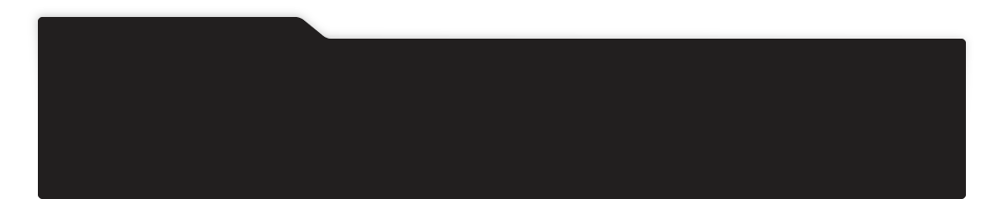
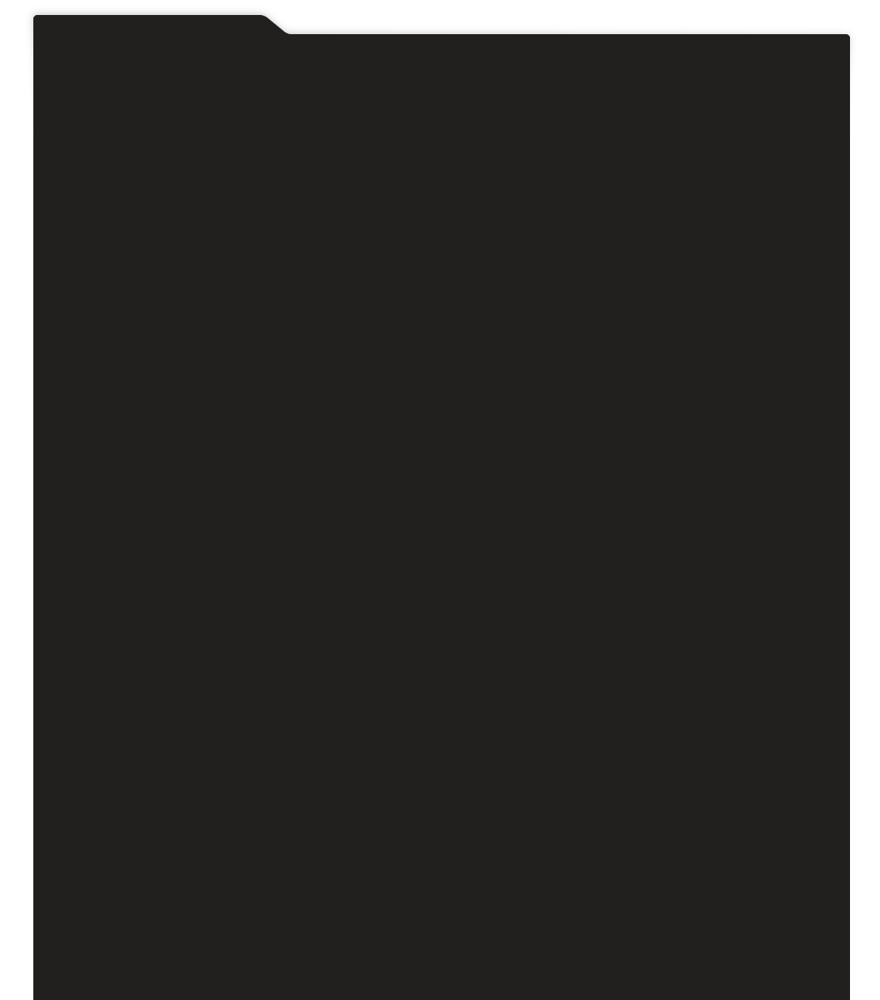
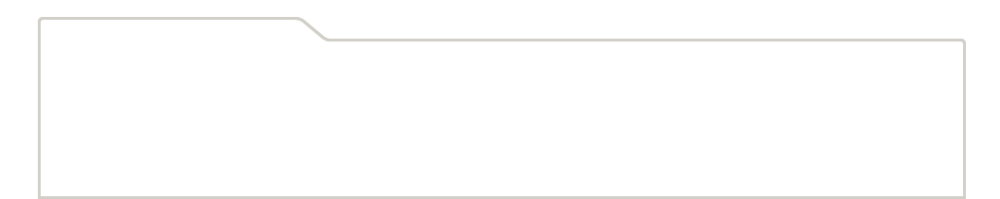
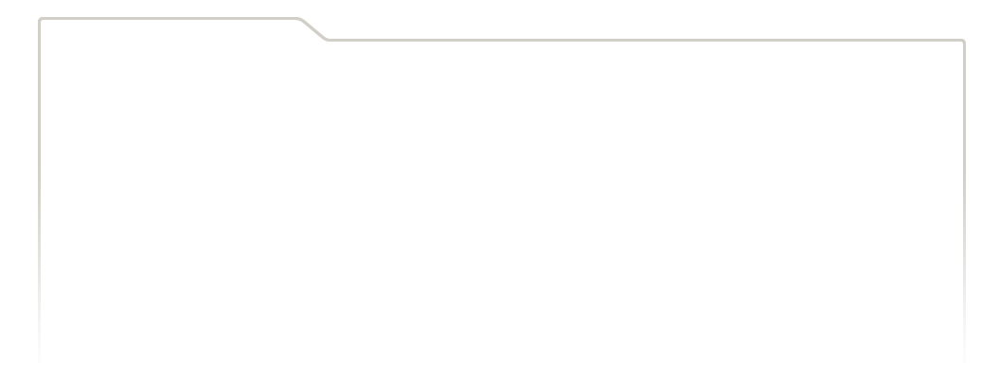
...
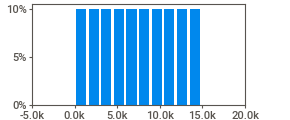
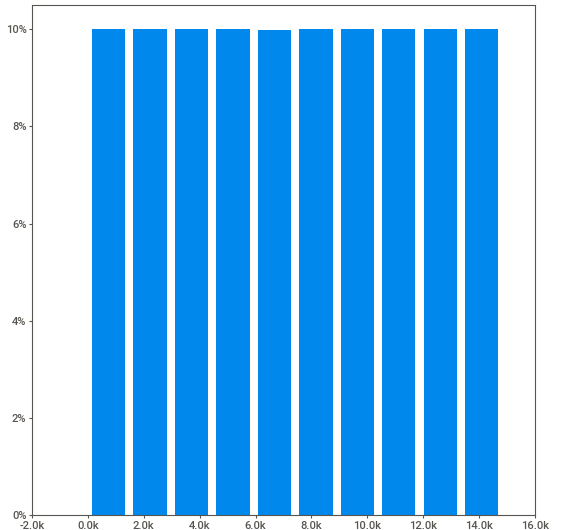
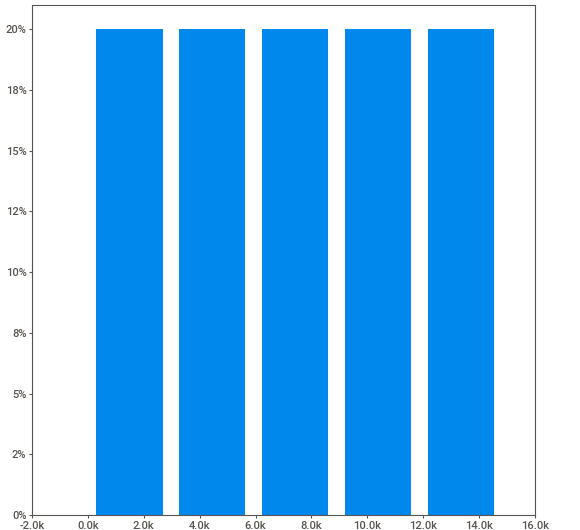
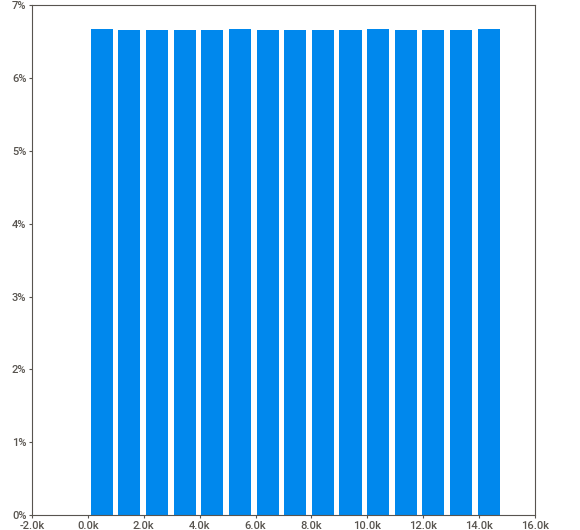
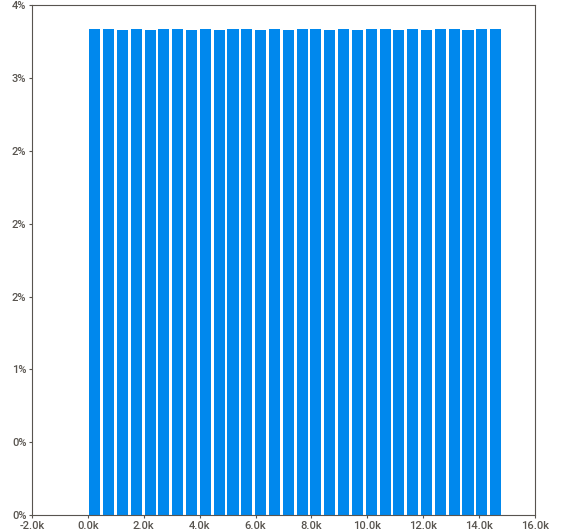

In [4]:
# Criando o relatório
df_eda = sv.analyze(df, pairwise_analysis='off')
df_eda.show_html('fraud_prevention_eda.html') # save as html file to better explore data in a browser tab
df_eda.show_notebook(layout='vertical',w=1200, h=800, scale=0.9)

## Quartis & Outliers

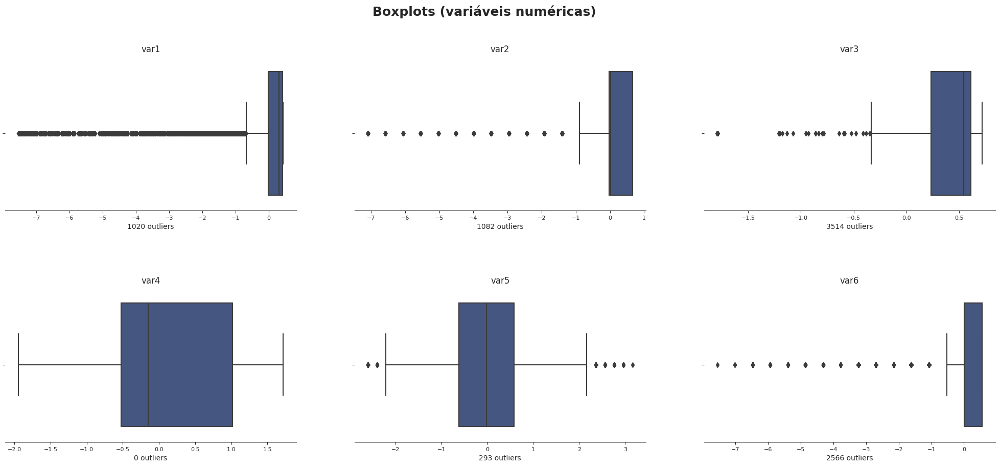

In [9]:
numeric_list = ['var1'
                ,'var2'
                ,'var3'
                ,'var4'
                ,'var5'
                ,'var6'
                ]

fig, axes = plt.subplots(2, 3, figsize=(25, 10), gridspec_kw=({'hspace':0.5}))
fig.suptitle('Boxplots (variáveis numéricas)', fontsize=18, weight='semibold')
sns.set_style("ticks")
sns.despine(left=True)

for column, r, c in zip(numeric_list, [0,0,0,1,1,1], [0,1,2,0,1,2]):
    ax = sns.boxplot(ax=axes[r, c], x=df[column], color='#3b528b')
    axes[r, c].set_title(column)
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    outlier_range = (df[column] < (Q1 - 1.5*IQR)) | (df[column] > (Q3 + 1.5 * IQR))
    num_outliers = df[column][outlier_range].count()
    ax.set(xlabel=f"{num_outliers} outliers")

## Distribuição por grupo

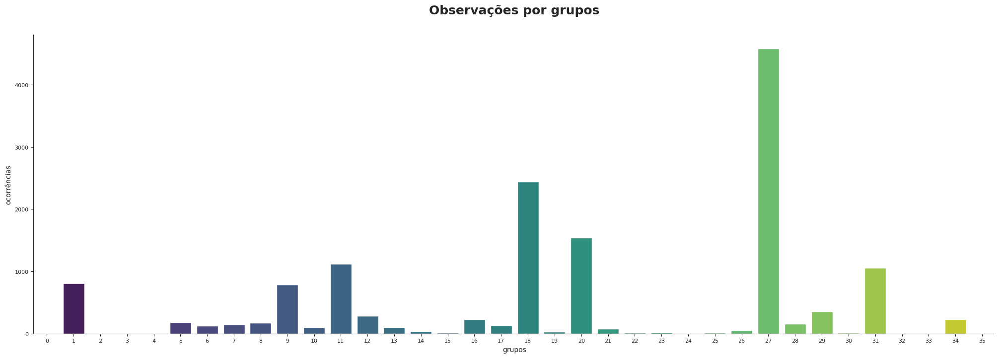

In [22]:
plt.figure(figsize=(25,8))
plt.title('Observações por grupos', fontsize=18, weight='semibold', pad=30)
sns.set_style("ticks")
sns.despine(left=False)
ax = sns.countplot(x="group", data=df, palette='viridis')
ax.set(ylabel='ocorrências')
ax.set(xlabel='grupos');

## Matrix de correlação

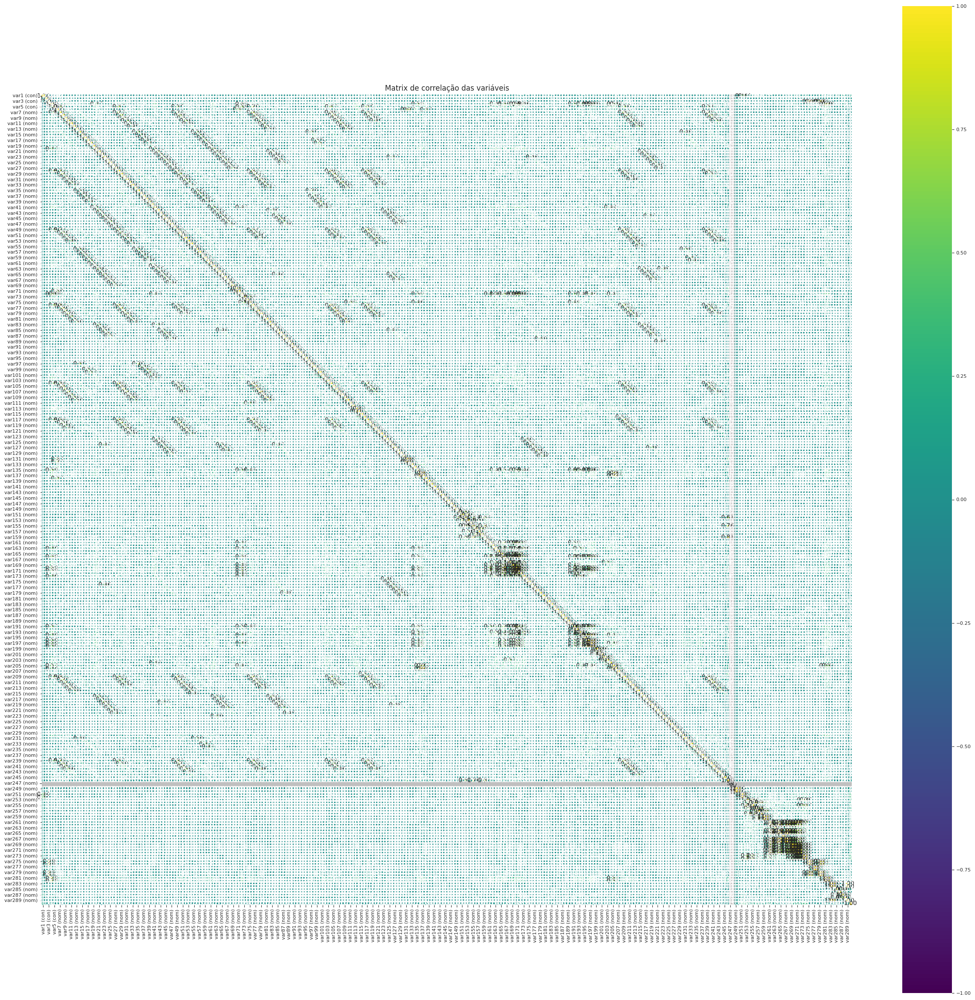

In [10]:
# Countinuous x Countinuous: Person's R
# Countinuous x Categorical: Correlation Ratio
# Categorical x Categorical: Cramer's V
nominal.associations(df.drop(['id','group'], axis=1), numerical_columns=numeric_list, mark_columns=True, figsize=(30,30), cmap='viridis', title='Matrix de correlação das variáveis');